# Purpose: Old script for checking a previous version of my data generation code to ensure that the training samples are good; this version used difference images instead of the science-reference pairs I use now for the dataset

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import LinearStretch, ZScaleInterval, ImageNormalize
import glob
import sep
from photutils import detect_threshold, detect_sources, deblend_sources, source_properties

In [2]:
def normalize(arr):
    return ImageNormalize(arr, interval=ZScaleInterval(), stretch=LinearStretch())(arr)

In [59]:
positive = np.load("/media/rd1/ztf_neos/training_examples/positive.npy")
negative = np.load("/media/rd1/ztf_neos/training_examples/negative.npy")

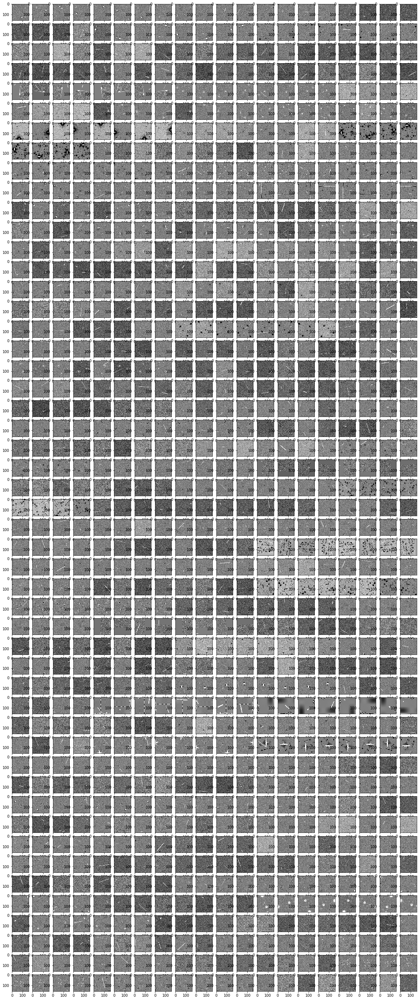

In [4]:
fig, ax = plt.subplots(40, 16, figsize=(20, 50))
ax = ax.flatten()
i = 0
for i in range(len(ax)):
    ax[i].imshow(normalize(positive[i]), cmap="gray")
    i += 1

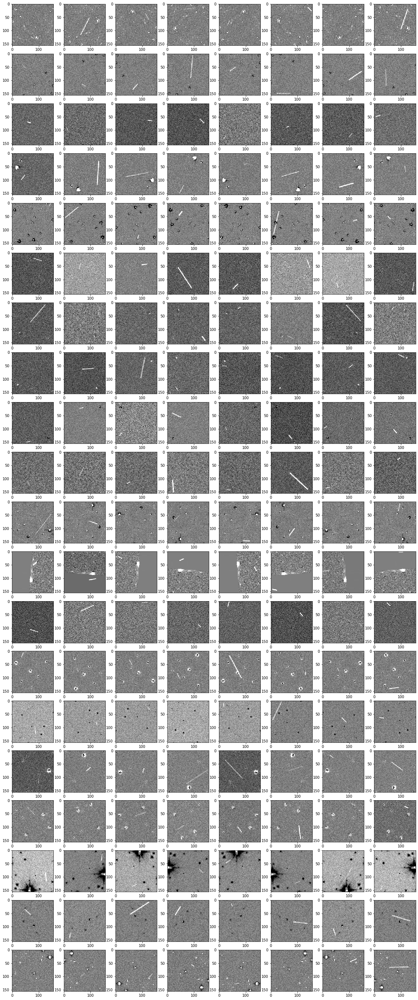

In [66]:
fig, ax = plt.subplots(20, 8, figsize=(20, 50))
ax = ax.flatten()
i = 0
for i in range(len(ax)):
    ax[i].imshow(normalize(positive[i]), cmap="gray")
    i += 1

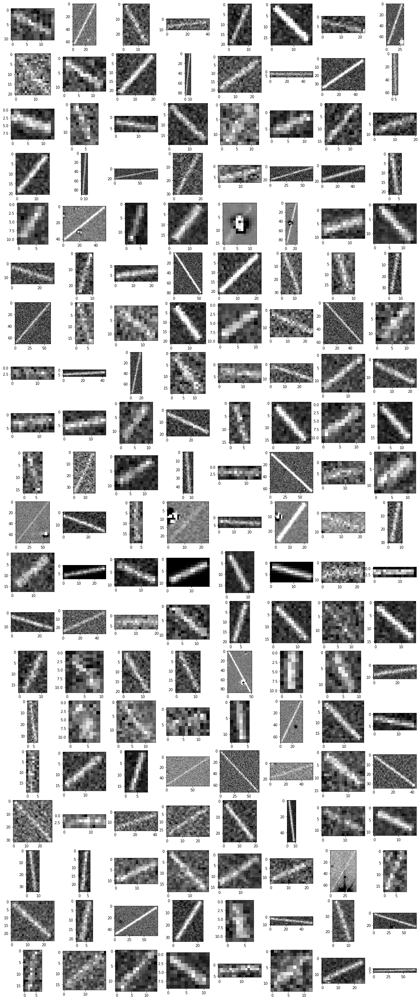

In [72]:
fig, ax = plt.subplots(20, 8, figsize=(20, 50))
ax = ax.flatten()
i = 0
for i in range(len(ax)):
    streak = positive[i] - negative[i]    
    
    y1 = np.nonzero(np.sum(streak, axis=1))[0][0]
    y2 = np.nonzero(np.sum(streak, axis=1))[0][-1] + 1

    x1 = np.nonzero(np.sum(streak, axis=0))[0][0]
    x2 = np.nonzero(np.sum(streak, axis=0))[0][-1] + 1

    ax[i].imshow(normalize(positive[i][y1:y2, x1:x2]), cmap="gray")
    i += 2


# plt.imshow((positive[i][y1:y2, x1:x2]), cmap="gray")

# plt.figure(figsize=(5,5))
# plt.imshow((positive[i][y1:y2, x1:x2] - negative[i][y1:y2, x1:x2]), cmap="gray")

In [79]:
def distance(c1, c2):
    return ((c1[0] - c2[0])**2 + (c1[1] - c2[1])**2) ** 0.5
filenames = glob.glob("/media/rd1/ztf_neos/differenced_images/*.npy")
i = 0
streaks = []
for file in filenames:
    image = np.load(file)
    
    if image.size == 0:
        continue
    
    bkg = sep.Background(image)
    image = image - bkg
    
    threshold = bkg.rms() * 2
#     threshold = detect_threshold(image, 1.5)
#     threshold = skimage.filters.thresholding.threshold_(image)

    segm = detect_sources(image, threshold, 20, connectivity=4)

    try:
        segm = deblend_sources(image, segm, 20, connectivity=4)
    except:
        continue
    
    info = source_properties(image, segm)
    max_length = 0
    
    best_streak = None

    for obj in info:

        cutout = obj.data_cutout_ma
        elongation = obj.elongation
        bbox = np.array(obj.bbox, np.float64)
        rotation = obj.orientation

        length = distance(cutout.shape, (0,0))
        midpoint = (image.shape[0] / 2, image.shape[1] / 2)
        if length > max(12, max_length) and elongation > 2 and min(distance(bbox[0:2], midpoint), distance(bbox[2:4], midpoint)) < 20:
            max_length = length
            i += 1
            best_streak = (cutout, rotation, length)
    if best_streak is not None:
        streaks.append(best_streak)
#             print(i)
#             print(rotation)
print(len(streaks))

200


IndexError: index 160 is out of bounds for axis 0 with size 160

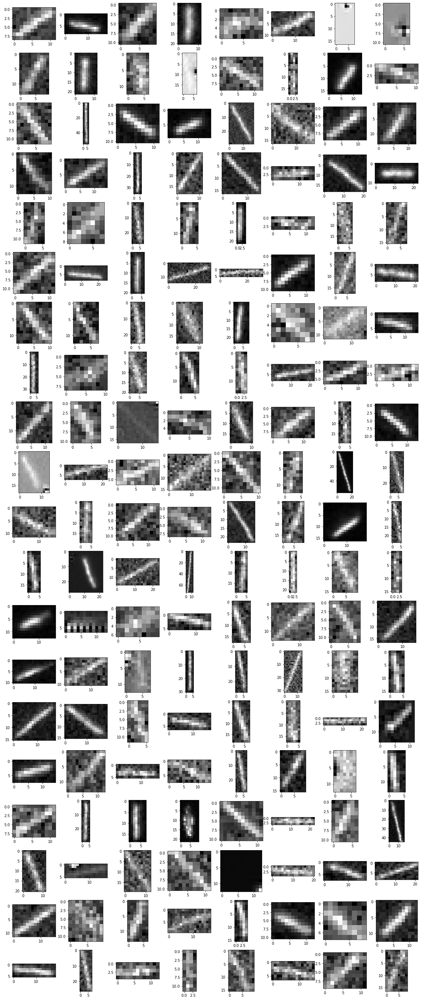

In [80]:
fig, ax = plt.subplots(20, 8, figsize=(20, 50))
ax = ax.flatten()
i = 0
for streak in streaks:
    ax[i].imshow(streak[0].data, cmap="gray")
    i += 1

In [94]:
streak = np.repeat(np.ones((1, 100)) * 10, 30, axis=0)
streak[0][0] = 0

-0.0016666666666666668


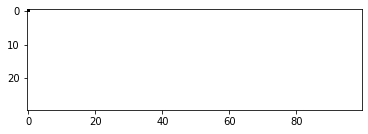

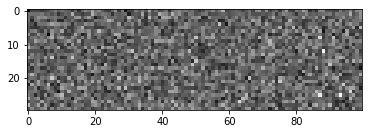

<Figure size 432x288 with 0 Axes>

In [106]:
plt.imshow(streak, cmap="gray")
plt.figure()
plt.imshow(np.random.poisson(streak), cmap="gray")
plt.figure()
print(np.mean(streak - np.random.poisson(streak)))